# Stitching Tutorial

Stitching Pipeline의 작업 흐름은 다음에서 볼 수 있습니다. 이미지는 [OpenCV Documentation](https://docs.opencv.org/3.4/d1/d46/group__stitching.html) 에서 가져온 것 입니다.

![image stitching pipeline](https://github.com/opencv/opencv/blob/master/modules/stitching/doc/StitchingPipeline.jpg?raw=true)

다음 블록을 사용하면 노트북 내에서 결과 이미지를 표시할 수 있습니다.

In [1]:
from matplotlib import pyplot as plt
import cv2 as cv
import numpy as np

def plot_image(img, figsize_in_inches=(5,5)):
    fig, ax = plt.subplots(figsize=figsize_in_inches)
    ax.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.show()
    
def plot_images(imgs, figsize_in_inches=(5,5)):
    fig, axs = plt.subplots(1, len(imgs), figsize=figsize_in_inches)
    for col, img in enumerate(imgs):
        axs[col].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.show()

다음 블록을 사용하여 사용된 이미지 세트에 대한 올바른 img 경로를 로드합니다.

In [2]:
from pathlib import Path
def get_image_paths(img_set):
    return [str(path.relative_to('.')) for path in Path('imgs').rglob(f'{img_set}*')]

weir_imgs = get_image_paths('weir')
budapest_imgs = get_image_paths('buda')
exposure_error_imgs = get_image_paths('exp')

## 이미지 크기 조정

첫 번째 단계는 이미지의 크기를 중간(그리고 나중에는 낮은) 해상도로 조정하는 것입니다. 사용할 수 있는 클래스는 `ImageHandler` 클래스입니다. 이미지를 전체 해상도로 연결하지 않아야 하는 경우 `final_megapix` 매개변수를 0보다 큰 숫자로 설정하면 됩니다.

`ImageHandler(medium_megapix=0.6, low_megapix=0.1, final_megapix=-1)`

In [3]:
from stitching.image_handler import ImageHandler

img_handler = ImageHandler()
img_handler.set_img_names(weir_imgs)

medium_imgs = list(img_handler.resize_to_medium_resolution())
low_imgs = list(img_handler.resize_to_low_resolution(medium_imgs))
final_imgs = list(img_handler.resize_to_final_resolution())

**참고:** 이 노트북에서 호출될 때 마다 `list()` 함수가 생성기를 반환함을 의미합니다(생성기는 전체 스티칭 성능을 향상시킵니다). 한 번에 모든 요소를 ​​얻으려면 다음을 사용합니다.`list(generator_object)`

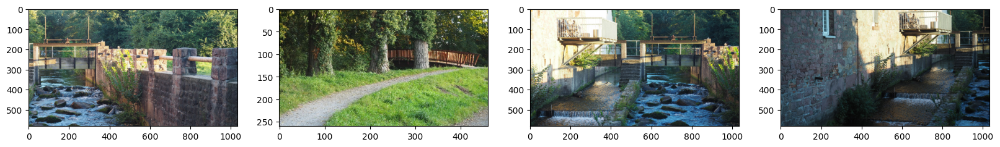

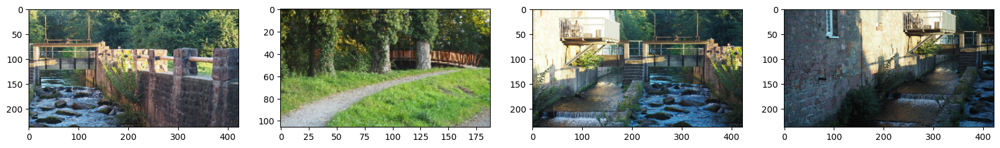

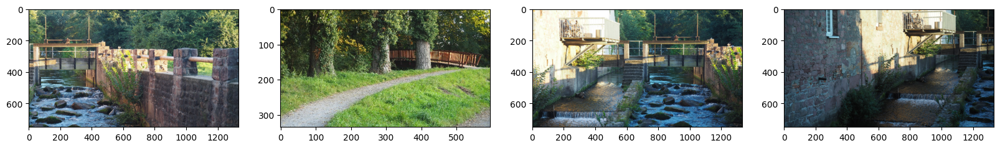

In [4]:
plot_images(medium_imgs, (20,20))
plot_images(low_imgs, (20,20))
plot_images(final_imgs, (20,20))

In [5]:
original_size = img_handler.img_sizes[0]
medium_size = img_handler.get_image_size(medium_imgs[0])
low_size = img_handler.get_image_size(low_imgs[0])
final_size = img_handler.get_image_size(final_imgs[0])

print(f"Original Size: {original_size}  -> {'{:,}'.format(np.prod(original_size))} px ~ 1 MP")
print(f"Medium Size:   {medium_size}  -> {'{:,}'.format(np.prod(medium_size))} px ~ 0.6 MP")
print(f"Low Size:      {low_size}   -> {'{:,}'.format(np.prod(low_size))} px ~ 0.1 MP")
print(f"Final Size:    {final_size}  -> {'{:,}'.format(np.prod(final_size))} px ~ 1 MP")

Original Size: (1333, 750)  -> 999,750 px ~ 1 MP
Medium Size:   (1033, 581)  -> 600,173 px ~ 0.6 MP
Low Size:      (422, 237)   -> 100,014 px ~ 0.1 MP
Final Size:    (1333, 750)  -> 999,750 px ~ 1 MP


## 특징 찾기

중간 이미지에서 우리는 이제 다른 이미지에서도 볼 수 있는 이미지 내에서 눈에 띄는 요소를 설명할 수 있는 기능을 찾고 싶습니다. 사용할 수 있는 클래스는 `FeatureDetector` 클래스입니다.

`FeatureDetector(detector='orb', nfeatures=500)`

In [6]:
from stitching.feature_detector import FeatureDetector

finder = FeatureDetector()
features = [finder.detect_features(img) for img in medium_imgs]
keypoints_center_img = finder.draw_keypoints(medium_imgs[0], features[0])

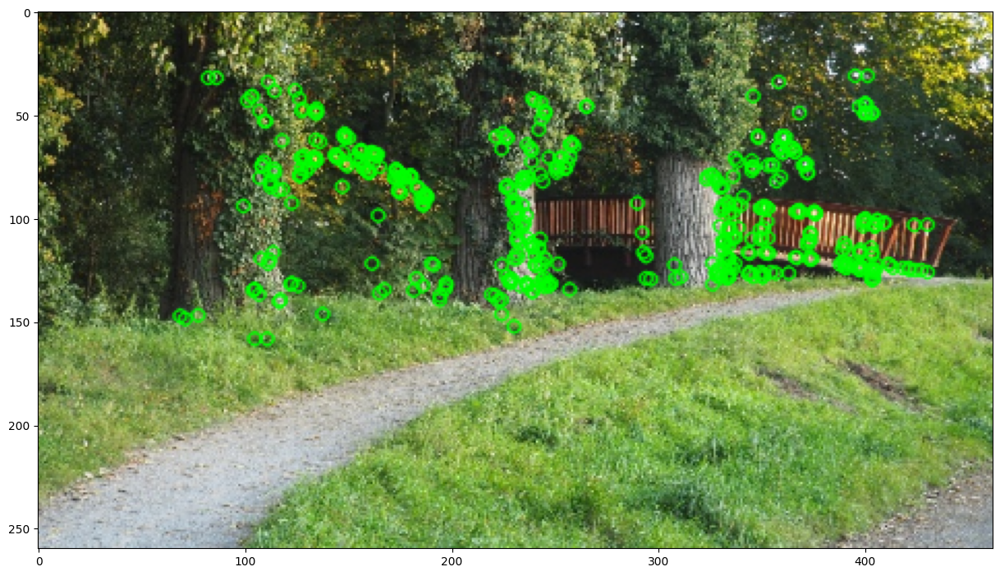

In [7]:
plot_image(keypoints_center_img, (15,10))

## 일치 기능

이제 pairwise 이미지의 기능을 일치시킬 수 있습니다. 사용할 수 있는 클래스는 `FeatureMatcher` 클래스입니다.

`FeatureMatcher(matcher_type='homography', range_width=-1)`

In [8]:
from stitching.feature_matcher import FeatureMatcher

matcher = FeatureMatcher()
matches = matcher.match_features(features)

다음과 같이 계산된 신뢰도를 확인할 수 있습니다.

`confidence = number of inliers / (8 + 0.3 * number of matches)` ( [이 파일](https://github.com/opencv/opencv/blob/68d15fc62edad980f1ffa15ee478438335f39cc3/modules/stitching/src/matchers.cpp) 의 435-7행 )

inlier는 RANSAC(Random Sample Consensus) 방법을 사용하여 계산됩니다(예: Line 425의 [이 파일](https://github.com/opencv/opencv/blob/68d15fc62edad980f1ffa15ee478438335f39cc3/modules/stitching/src/matchers.cpp) 에서). 나중에 표시되는 inlier를 그릴 수 있습니다.

In [9]:
matcher.get_confidence_matrix(matches)

array([[0.        , 0.46052632, 1.78470255, 0.37383178],
       [0.46052632, 0.        , 0.46875   , 0.4       ],
       [1.78470255, 0.46875   , 0.        , 2.45173745],
       [0.37383178, 0.4       , 2.45173745, 0.        ]])

다음과 같이 알 수 있습니다.

- 이미지 1은 이미지 2와 일치 신뢰도가 높고 이미지 3 및 4에 대한 신뢰도가 낮습니다.
- 이미지 2는 이미지 1 및 이미지 3과 일치 신뢰도가 높고 이미지 4와 일치 신뢰도가 낮습니다.
- 이미지 3은 이미지 2와 일치 신뢰도가 높고 이미지 1 및 4에 대한 신뢰도가 낮습니다.
- 이미지 4는 이미지 1, 2 및 3과 일치 신뢰도가 낮습니다.

다음 단계에서 자세히 소개되는 `confidence_threshold`을 사용하면 다음과 같은 inlier와 관련된 일치를 표시할 수 있다.

Matches Image 1 to Image 3


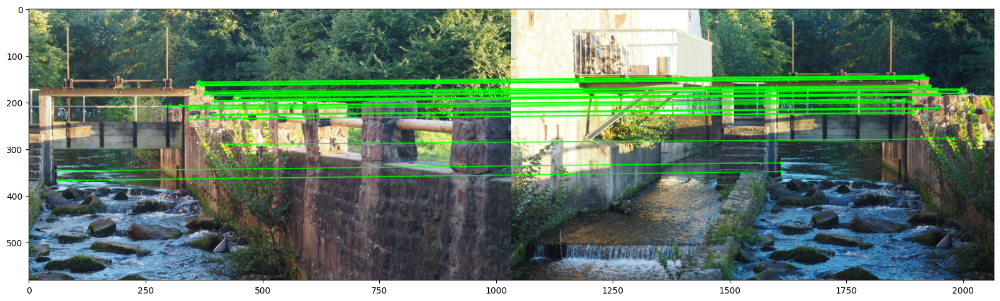

Matches Image 3 to Image 4


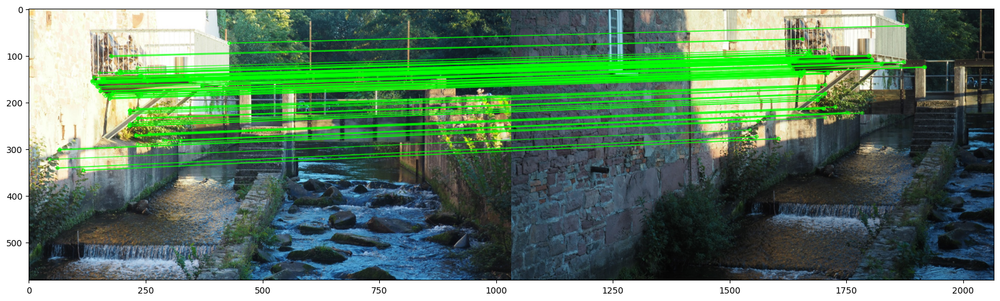

In [10]:
all_relevant_matches = matcher.draw_matches_matrix(medium_imgs, features, matches, conf_thresh=1, 
                                                   inliers=True, matchColor=(0, 255, 0))

for idx1, idx2, img in all_relevant_matches:
    print(f"Matches Image {idx1+1} to Image {idx2+1}")
    plot_image(img, (20,10))

## 부분집합

위에서 우리는 노이즈 이미지가 파노라마의 일부인 다른 이미지와 관련이 없다는 것을 보았다. 이제 관련 이미지만 사용하여 하위 집합을 생성하려고 합니다. 사용할 수 있는 클래스는 `Subsetter` 클래스입니다. 일치가 좋은 일치로 간주될 때부터 `confidence_threshold`를 지정할 수 있습니다. 우리는 우리의 경우 `1`이면 충분하다는 것을 보았다. `matches_graph_dot_file` 매개 변수의 경우 파일 이름을 전달할 수 있으며, 여기서 도트 표기법의 일치 그래프가 저장됩니다.

`Subsetter(confidence_threshold=1, matches_graph_dot_file=None)`

In [11]:
from stitching.subsetter import Subsetter

subsetter = Subsetter()
dot_notation = subsetter.get_matches_graph(img_handler.img_names, matches)
print(dot_notation)

graph matches_graph{
"weir_3.jpg" -- "weir_2.jpg"[label="Nm=91, Ni=63, C=1.7847"];
"weir_2.jpg" -- "weir_1.jpg"[label="Nm=146, Ni=127, C=2.45174"];
"weir_noise.jpg";
}


일치 그래프는 신뢰 행렬에서 본 내용을 시각화한다: 이미지 1은 이미지 2에 연결된 이미지 3에 연결된 이미지이다. 이미지 4는 파노라마의 일부가 아닙니다(정적 이미지이므로 신뢰도가 달라질 수 있음).

![match_graph](https://github.com/lukasalexanderweber/opencv_stitching_tutorial/blob/master/docs/static_files/match_graph.png?raw=true)

그래프를 표시하는 데 [GraphvizOnline](https://dreampuf.github.io/GraphvizOnline)이 사용됩니다.

이제 다음을 포함하여 지금까지 만든 모든 변수를 부분 집합으로 설정하려고 합니다. `ImageHandler`의 속성 `img_names` 및 `img_sizes`

In [12]:
indices = subsetter.get_indices_to_keep(features, matches)

medium_imgs = subsetter.subset_list(medium_imgs, indices)
low_imgs = subsetter.subset_list(low_imgs, indices)
final_imgs = subsetter.subset_list(final_imgs, indices)
features = subsetter.subset_list(features, indices)
matches = subsetter.subset_matches(matches, indices)

img_names = subsetter.subset_list(img_handler.img_names, indices)
img_sizes = subsetter.subset_list(img_handler.img_sizes, indices)

img_handler.img_names, img_handler.img_sizes = img_names, img_sizes

print(img_handler.img_names)
print(matcher.get_confidence_matrix(matches))

['imgs/weir_3.jpg', 'imgs/weir_2.jpg', 'imgs/weir_1.jpg']
[[0.         1.78470255 0.37383178]
 [1.78470255 0.         2.45173745]
 [0.37383178 2.45173745 0.        ]]


## 카메라 추정, 조정 및 보정
우리는 이제 특징과 매치를 통해 이미지를 올바르게 구성할 수 있도록 왜곡하는 데 사용할 수 있는 카메라를 보정하고자 합니다. 사용할 수 있는 클래스는 `Camera Estimator`, `Camera Adjuster` 및 `Wave Corrector`입니다.

```
CameraEstimator(estimator='homography')
CameraAdjuster(adjuster='ray', refinement_mask='xxxxx')
WaveCorrector(wave_correct_kind='horiz')
```

In [13]:
from stitching.camera_estimator import CameraEstimator
from stitching.camera_adjuster import CameraAdjuster
from stitching.camera_wave_corrector import WaveCorrector

camera_estimator = CameraEstimator()
camera_adjuster = CameraAdjuster()
wave_corrector = WaveCorrector()

cameras = camera_estimator.estimate(features, matches)
cameras = camera_adjuster.adjust(features, matches, cameras)
cameras = wave_corrector.correct(cameras)

## Warp Images

획득한 카메라로 우리는 이제 이미지 자체를 최종 평면으로 왜곡하고 싶다. 사용할 수 있는 클래스는 `Warper` 클래스입니다.

`Warper(warper_type='spherical', scale=1)`

In [14]:
from stitching.warper import Warper

warper = Warper()

처음에는 카메라의 중간 초점 거리를 스케일로 설정합니다.

In [15]:
warper.set_scale(cameras)

저해상도 이미지 왜곡

In [16]:
low_sizes = img_handler.get_low_img_sizes()
camera_aspect = img_handler.get_medium_to_low_ratio()      # since cameras were obtained on medium imgs

warped_low_imgs = list(warper.warp_images(low_imgs, cameras, camera_aspect))
warped_low_masks = list(warper.create_and_warp_masks(low_sizes, cameras, camera_aspect))
low_corners, low_sizes = warper.warp_rois(low_sizes, cameras, camera_aspect)

최종 해상도 영상 왜곡

In [17]:
final_sizes = img_handler.get_final_img_sizes()
camera_aspect = img_handler.get_medium_to_final_ratio()    # since cameras were obtained on medium imgs

warped_final_imgs = list(warper.warp_images(final_imgs, cameras, camera_aspect))
warped_final_masks = list(warper.create_and_warp_masks(final_sizes, cameras, camera_aspect))
final_corners, final_sizes = warper.warp_rois(final_sizes, cameras, camera_aspect)

우리는 결과를 플롯할 수 있다. 영상을 정렬하는 데 많은 스케일링과 회전은 필요하지 않습니다. 따라서 이 예에서는 영상이 약간만 조정됩니다.

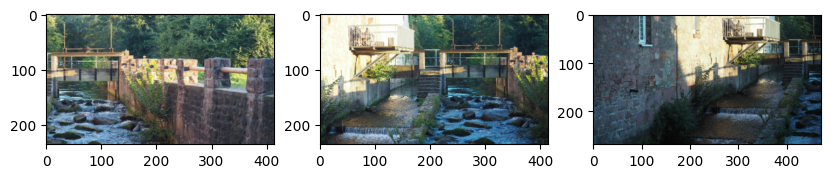

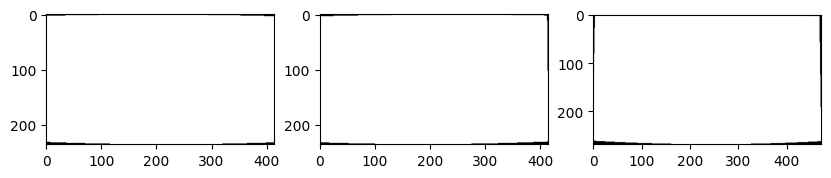

In [18]:
plot_images(warped_low_imgs, (10,10))
plot_images(warped_low_masks, (10,10))

모서리가 뒤틀리고 크기가 크기 때문에 최종 평면에서 이미지가 배치되는 위치를 알 수 있습니다.

In [19]:
print(final_corners)
print(final_sizes)

[(-20, 4002), (-678, 4021), (-1362, 4059)]
[(1311, 745), (1311, 745), (1495, 846)]


## Excursion(익스커전): Timelapser

타임랩서 기능은 이미지가 최종 평면으로 어떻게 왜곡되는지 파악하는 데 좋은 방법입니다. 사용할 수 있는 클래스는 `Timelapser` 클래스입니다.

`Timelapser(timelapse='no')`

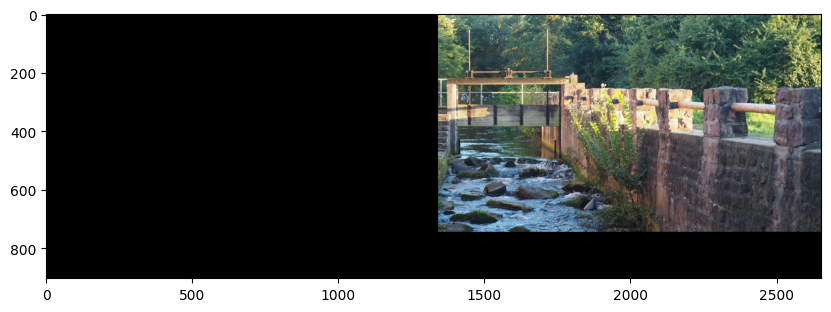

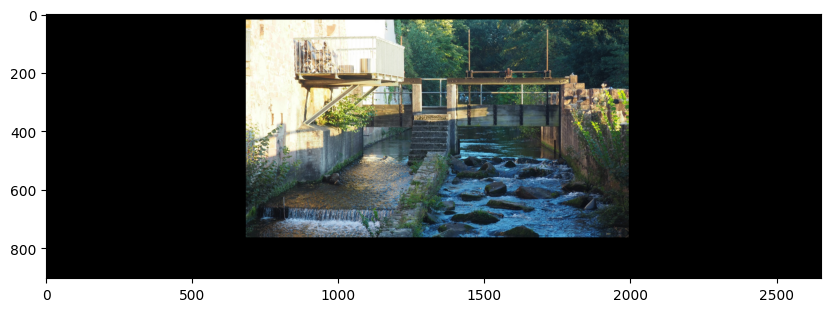

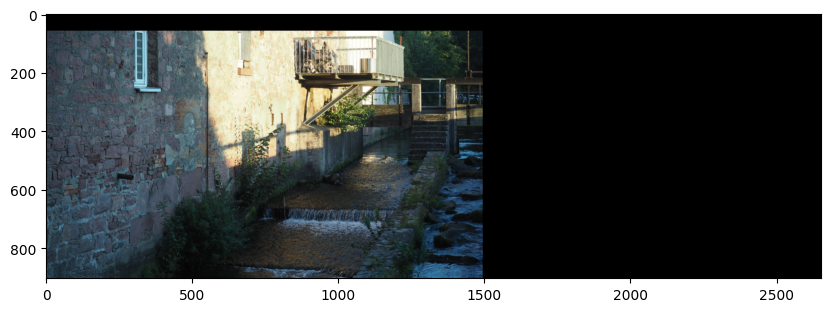

In [20]:
from stitching.timelapser import Timelapser

timelapser = Timelapser('as_is')
timelapser.initialize(final_corners, final_sizes)

for img, corner in zip(warped_final_imgs, final_corners):
    timelapser.process_frame(img, corner)
    frame = timelapser.get_frame()
    plot_image(frame, (10,10))

## Crop

우리는 어떤 영상도 최종 평면의 전체 높이를 가지고 있지 않다는 것을 알 수 있다. 검은색 테두리가 없는 파노라마를 얻기 위해 우리는 이제 가장 큰 관절 내부 직사각형을 추정하고 그에 따라 단일 이미지를 잘라낼 수 있다. 사용할 수 있는 클래스는 `Cropper` 클래스입니다.

`Cropper(crop=True)`

In [21]:
from stitching.cropper import Cropper

cropper = Cropper()

우리는 잠재적인 최종 파노라마의 파노라마 마스크를 추정할 수 있다(나중에 소개될 블렌더 사용).

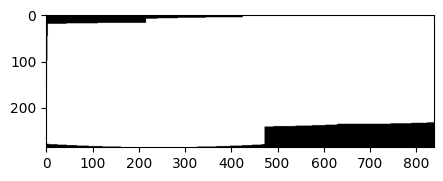

In [22]:
mask = cropper.estimate_panorama_mask(warped_low_imgs, warped_low_masks, low_corners, low_sizes)
plot_image(mask, (5,5))

가장 큰 내부 직사각형의 추정은 아직 OpenCV에서 구현되지 않았지만, 나만의 [Numba](https://numba.pydata.org/) 구현이다. 자세한 것은 [이쪽](https://github.com/lukasalexanderweber/lir)에서 확인해 보세요. 코드 컴파일에는 약간의 시간이 소요됩니다(한 번만 컴파일된 코드가 이후 함수 호출을 위해 [캐시됨](https://numba.pydata.org/numba-doc/latest/developer/caching.html)).

In [23]:
lir = cropper.estimate_largest_interior_rectangle(mask)

컴파일 후 계산 속도가 매우 빠릅니다.

In [24]:
lir = cropper.estimate_largest_interior_rectangle(mask)
print(lir)

Rectangle(x=4, y=21, width=834, height=212)


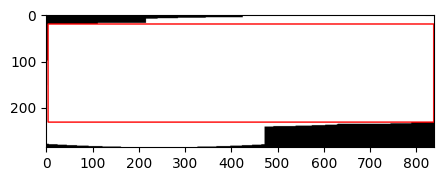

In [25]:
plot = lir.draw_on(mask, size=2)
plot_image(plot, (5,5))

뒤틀린 모서리의 중심을 0으로 맞추면 최종 평면 내에 있는 영상의 사각형을 확인할 수 있습니다. 여기에 중앙 영상이 표시됩니다.

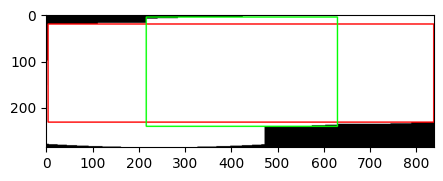

In [26]:
low_corners = cropper.get_zero_center_corners(low_corners)
rectangles = cropper.get_rectangles(low_corners, low_sizes)

plot = rectangles[1].draw_on(plot, (0, 255, 0), 2)  # The rectangle of the center img
plot_image(plot, (5,5))

오버랩을 사용하여 새로운 코너와 크기를 결정할 수 있습니다.

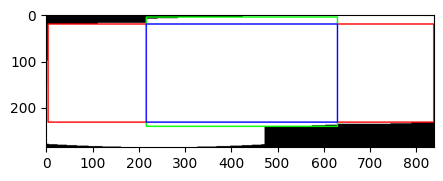

In [27]:
overlap = cropper.get_overlap(rectangles[1], lir)
plot = overlap.draw_on(plot, (255, 0, 0), 2)
plot_image(plot, (5,5))

원래 이미지(녹색)의 좌표계에 있는 파란색 직사각형을 사용하여 잘라낼 수 있습니다.

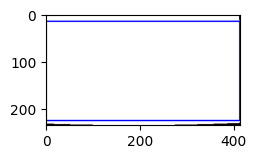

In [28]:
intersection = cropper.get_intersection(rectangles[1], overlap)
plot = intersection.draw_on(warped_low_masks[1], (255, 0, 0), 2)
plot_image(plot, (2.5,2.5))

이 모든 정보를 사용하여 이미지와 마스크를 자르고 새로운 모서리와 크기를 얻을 수 있습니다.

In [29]:
cropper.prepare(warped_low_imgs, warped_low_masks, low_corners, low_sizes)

cropped_low_masks = list(cropper.crop_images(warped_low_masks))
cropped_low_imgs = list(cropper.crop_images(warped_low_imgs))
low_corners, low_sizes = cropper.crop_rois(low_corners, low_sizes)

lir_aspect = img_handler.get_low_to_final_ratio()  # since lir was obtained on low imgs
cropped_final_masks = list(cropper.crop_images(warped_final_masks, lir_aspect))
cropped_final_imgs = list(cropper.crop_images(warped_final_imgs, lir_aspect))
final_corners, final_sizes = cropper.crop_rois(final_corners, final_sizes, lir_aspect)

잘라낸 이미지를 사용하여 timelapse를 다시 실행합니다.

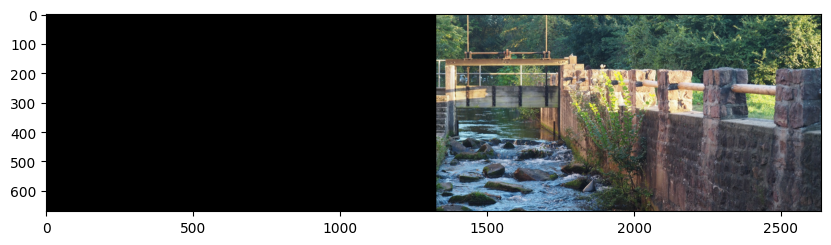

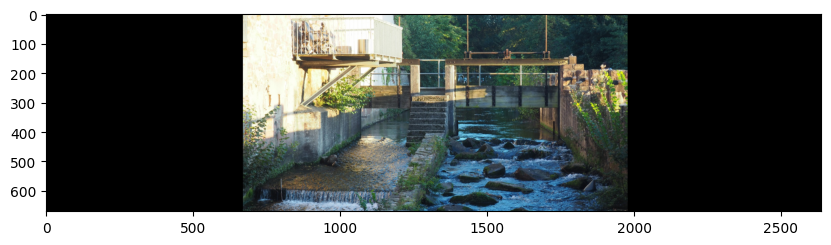

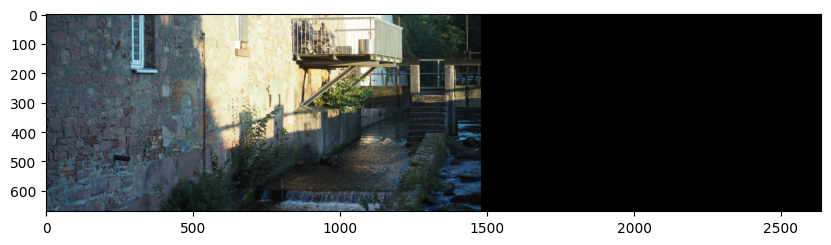

In [30]:
timelapser = Timelapser('as_is')
timelapser.initialize(final_corners, final_sizes)

for img, corner in zip(cropped_final_imgs, final_corners):
    timelapser.process_frame(img, corner)
    frame = timelapser.get_frame()
    plot_image(frame, (10,10))

Now we need stategies how to compose the already overlaying images into one panorama image. Strategies are:

- Seam Masks
- Exposure Error Compensation
- Blending

## Seam Masks

Seam masks find a transition line between images with the least amount of interference. The class which can be used is the `SeamFinder` class:

`SeamFinder(finder='dp_color')`

The Seams are obtained on the warped low resolution images and then resized to the warped final resolution images. The Seam Masks can be used in the Blending step to specify how the images should be composed.

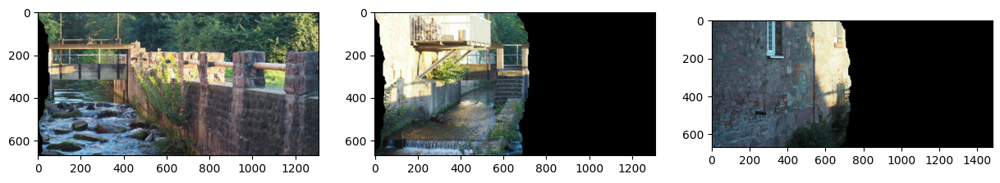

In [31]:
from stitching.seam_finder import SeamFinder

seam_finder = SeamFinder()

seam_masks = seam_finder.find(cropped_low_imgs, low_corners, cropped_low_masks)
seam_masks = [seam_finder.resize(seam_mask, mask) for seam_mask, mask in zip(seam_masks, cropped_final_masks)]

seam_masks_plots = [SeamFinder.draw_seam_mask(img, seam_mask) for img, seam_mask in zip(cropped_final_imgs, seam_masks)]
plot_images(seam_masks_plots, (15,10))

## Exposure Error Compensation

Frequently exposure errors respectively exposure differences between images occur which lead to artefacts in the final panorama. The class which can be used is the `ExposureErrorCompensator` class:

`ExposureErrorCompensator(compensator='gain_blocks', nr_feeds=1, block_size=32)`

The Exposure Error are estimated on the warped low resolution images and then applied on the warped final resolution images.

**Note:** In this example the compensation has nearly no effect and the result is not shown. To understand the stitching pipeline they are compensated anyway. A fitting example for images where Exposure Error Compensation is important can be found at the end of the notebook.   

In [32]:
from stitching.exposure_error_compensator import ExposureErrorCompensator

compensator = ExposureErrorCompensator()

compensator.feed(low_corners, cropped_low_imgs, cropped_low_masks)

compensated_imgs = [compensator.apply(idx, corner, img, mask) 
                    for idx, (img, mask, corner) 
                    in enumerate(zip(cropped_final_imgs, cropped_final_masks, final_corners))]

## Blending

With all the previous processing the images can finally be blended to a whole panorama. The class which can be used is the `Blender` class:

`Blender(blender_type='multiband', blend_strength=5)`

The blend strength thereby specifies on which overlap the images should be overlayed along the transitions of the masks. This is also visualized at the end of the notebook.

In [33]:
from stitching.blender import Blender

blender = Blender()
blender.prepare(final_corners, final_sizes)
for img, mask, corner in zip(compensated_imgs, seam_masks, final_corners):
    blender.feed(img, mask, corner)
panorama, _ = blender.blend()

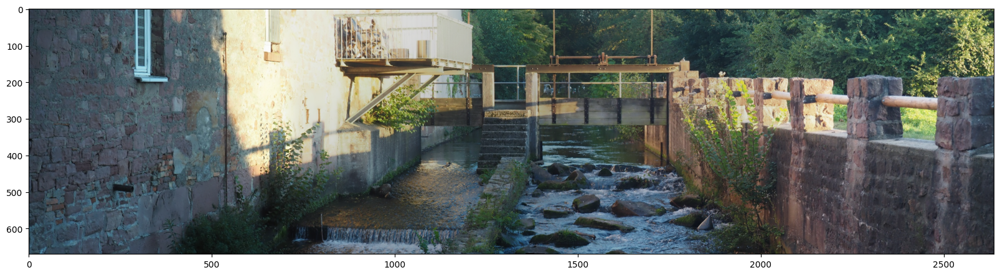

In [34]:
plot_image(panorama, (20,20))

There is the functionality to plot the seams as lines or polygons onto the final panorama to see which part of the panorama is from which image. The basis is to blend single colored dummy images with the obtained seam masks and panorama dimensions:

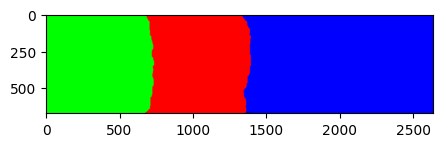

In [35]:
blended_seam_masks = seam_finder.blend_seam_masks(seam_masks, final_corners, final_sizes)
plot_image(blended_seam_masks, (5,5))

This blend can be converted into lines or weighted on top of the resulting panorama:

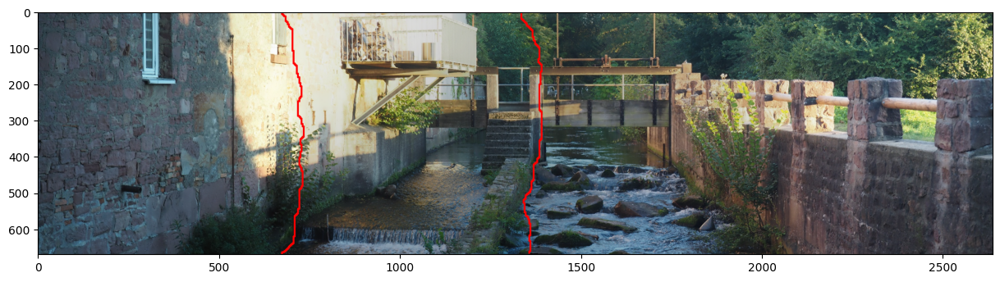

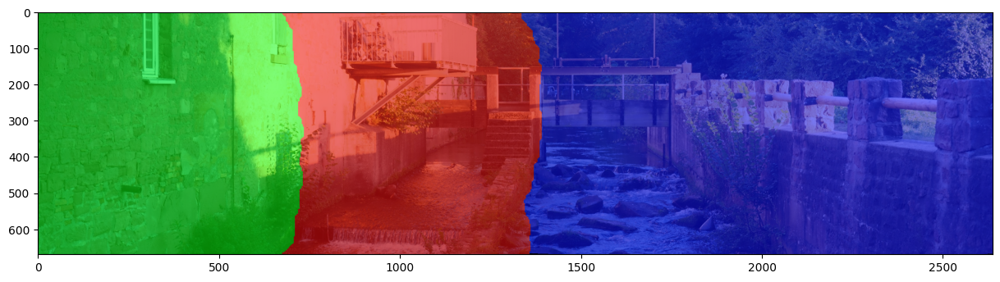

In [36]:
plot_image(seam_finder.draw_seam_lines(panorama, blended_seam_masks, linesize=3), (15,10))
plot_image(seam_finder.draw_seam_polygons(panorama, blended_seam_masks), (15,10))

# Stitcher

All the functionality above is automated within the `Stitcher` class:

`Stitcher(**kwargs)`

In [37]:
from stitching import Stitcher

stitcher = Stitcher()
panorama = stitcher.stitch(weir_imgs)

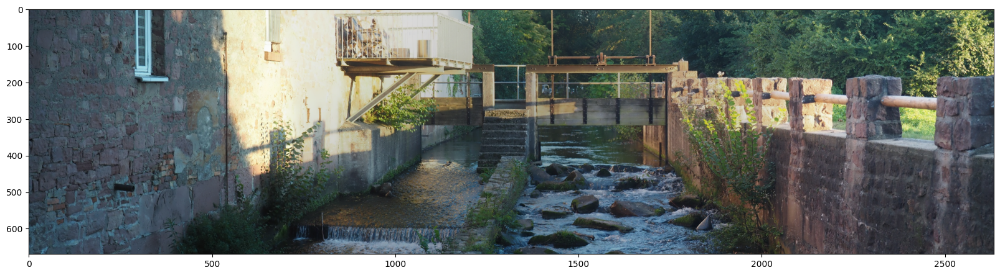

In [38]:
plot_image(panorama, (20,20))

## Affine Stitcher

For images that were obtained on e.g. a flatbed scanner affine transformations are sufficient. The `AffineStitcher` convenience class sets the needed parameters as default:

`AffineStitcher(**kwargs)`

In [39]:
from stitching import AffineStitcher

print(AffineStitcher.AFFINE_DEFAULTS)
# Comparison:
# print(Stitcher.DEFAULT_SETTINGS)
# print(AffineStitcher.DEFAULT_SETTINGS)

{'estimator': 'affine', 'wave_correct_kind': 'no', 'matcher_type': 'affine', 'adjuster': 'affine', 'warper_type': 'affine', 'compensator': 'no'}


We can now process the Budapest example (with two additional parameters)

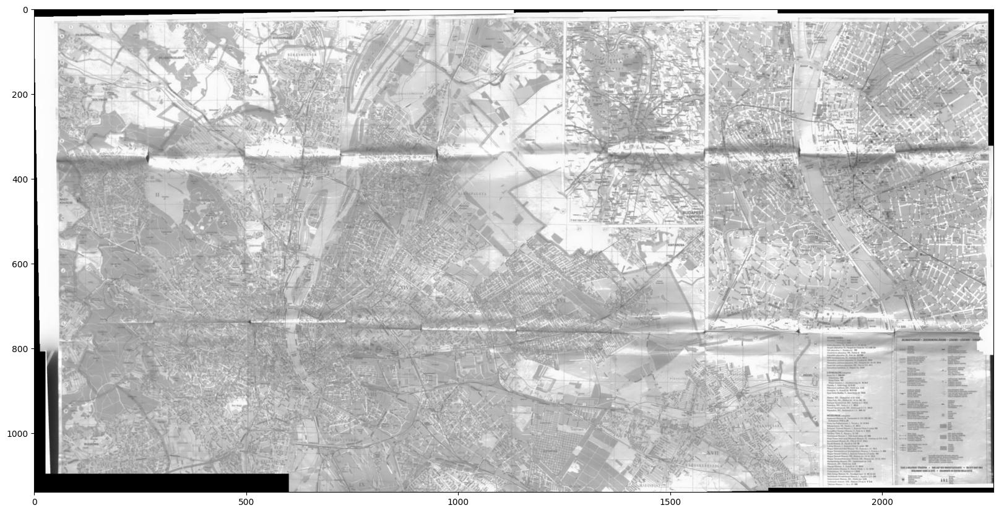

In [40]:
settings = {# The whole plan should be considered
            "crop": False,
            # The matches confidences aren't that good
            "confidence_threshold": 0.5}    

stitcher = AffineStitcher(**settings)
panorama = stitcher.stitch(budapest_imgs)

plot_image(panorama, (20,20))

## Exposure Error and Blend Strenght Example

In [41]:
imgs = exposure_error_imgs

stitcher = Stitcher(compensator="no", blender_type="no")
panorama1 = stitcher.stitch(imgs)

stitcher = Stitcher(compensator="no")
panorama2 = stitcher.stitch(imgs)

stitcher = Stitcher(compensator="no", blend_strength=20)
panorama3 = stitcher.stitch(imgs)

stitcher = Stitcher(blender_type="no")
panorama4 = stitcher.stitch(imgs)

stitcher = Stitcher(blend_strength=20)
panorama5 = stitcher.stitch(imgs)

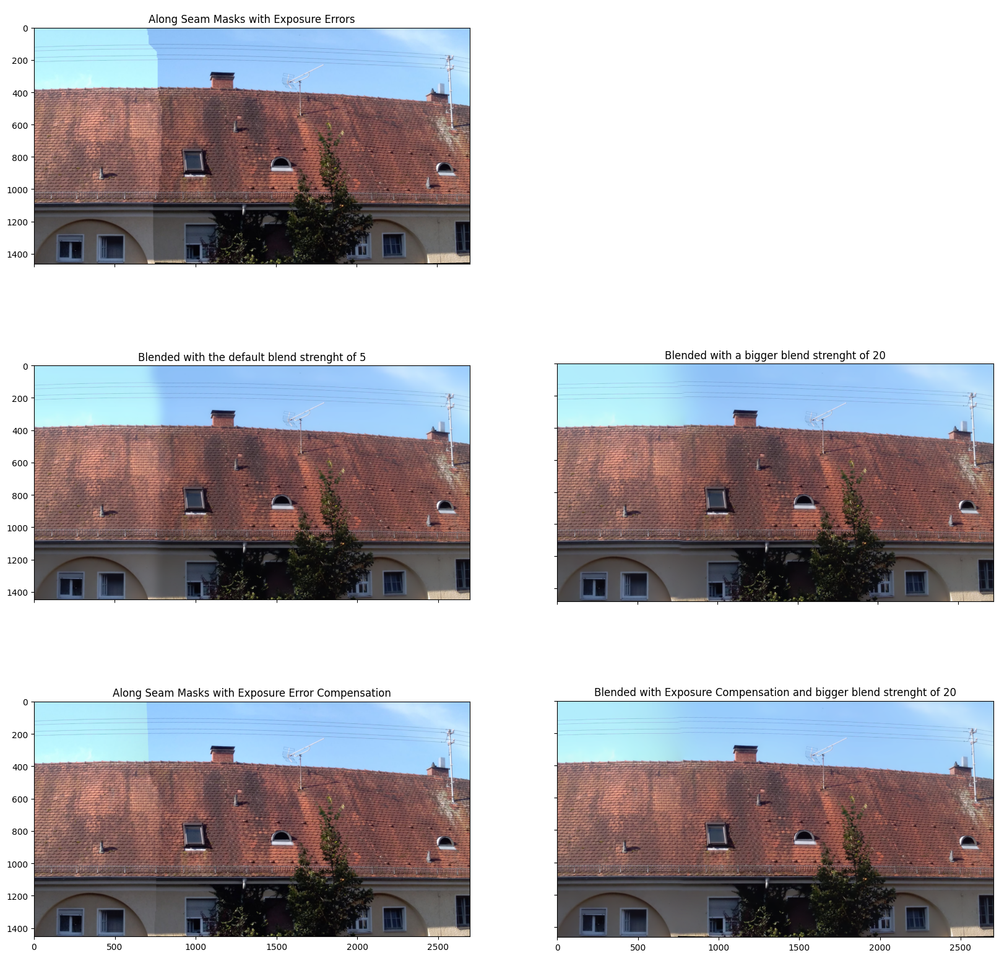

In [42]:
fig, axs = plt.subplots(3, 2, figsize=(20,20))
axs[0, 0].imshow(cv.cvtColor(panorama1, cv.COLOR_BGR2RGB))
axs[0, 0].set_title('Along Seam Masks with Exposure Errors')
axs[0, 1].axis('off')
axs[1, 0].imshow(cv.cvtColor(panorama2, cv.COLOR_BGR2RGB))
axs[1, 0].set_title('Blended with the default blend strenght of 5')
axs[1, 1].imshow(cv.cvtColor(panorama3, cv.COLOR_BGR2RGB))
axs[1, 1].set_title('Blended with a bigger blend strenght of 20')
axs[2, 0].imshow(cv.cvtColor(panorama4, cv.COLOR_BGR2RGB))
axs[2, 0].set_title('Along Seam Masks with Exposure Error Compensation')
axs[2, 1].imshow(cv.cvtColor(panorama5, cv.COLOR_BGR2RGB))
axs[2, 1].set_title('Blended with Exposure Compensation and bigger blend strenght of 20')

# Hide x labels and tick labels for top plots and y ticks for right plots.
for ax in axs.flat:
    ax.label_outer()